In [2]:
import os
os.environ["CUDA_DEVICE_ORDER"]= "PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"]= "3"

%matplotlib inline
from matplotlib import pyplot as plt

import numpy as np
import json, string
import cv2
from collections import Counter, defaultdict
#from tabletext import to_text
from tabulate import tabulate

In [3]:
from keras.models import load_model
from keras.models import Sequential, Model
from contextlib import redirect_stdout

Using TensorFlow backend.


In [4]:
# Question, Answer, Image Path, Object Coordinates
qai_data = np.load("../preprocessed_data/scratch/gw_test_Q_A_ImgPath.npy")
# Image, Object, Spatial, Category, QA, Status
vec_data = np.load("../preprocessed_data/scratch/gw_test_vec.npy")
# History data
his_data = np.load("../preprocessed_data/scratch/hist_test.npy")
# Category Name with id 
category_list = json.load(open("../preprocessed_data/scratch/category_list"))
# Category
cat_data_1 = np.load("../preprocessed_data/scratch/gw_test_cat_id.npy")

In [6]:
question = [i[0] for i in qai_data] # List of questions in the game
answer = [i[1] for i in qai_data] # List of answers in the game
img_path = [i[2] for i in qai_data] # Image path to read the image
obj_coor = [i[3] for i in qai_data] # Object co-ordinates to draw bounding box
spatial = [i[2] for i in vec_data] # Spatial co-ordinates of the object
status = [i[5] for i in vec_data] # Status of the game
cat_data = [i[3] for i in vec_data] # Category id of the object
image = [i[0] for i in vec_data] # Image path to read the image

In [63]:
dict_categories = {'donut': 0,
 'hot dog': 1,
 'giraffe': 2,
 'sports ball': 3,
 'kite': 4,
 'bear': 5,
 'apple': 6,
 'tennis racket': 7,
 'airplane': 8,
 'cat': 9,
 'bottle': 10,
 'toaster': 11,
 'fork': 12,
 'cake': 13,
 'toothbrush': 14,
 'car': 15,
 'boat': 16,
 'pizza': 17,
 'bird': 18,
 'stop sign': 19,
 'scissors': 20,
 'orange': 21,
 'teddy bear': 22,
 'knife': 23,
 'truck': 24,
 'parking meter': 25,
 'person': 26,
 'cow': 27,
 'refrigerator': 28,
 'horse': 29,
 'bench': 30,
 'tie': 31,
 'motorcycle': 32,
 'spoon': 33,
 'train': 34,
 'cup': 35,
 'bed': 36,
 'remote': 37,
 'sandwich': 38,
 'mouse': 39,
 'dog': 40,
 'suitcase': 41,
 'snowboard': 42,
 'umbrella': 43,
 'broccoli': 44,
 'skis': 45,
 'backpack': 46,
 'cell phone': 47,
 'bus': 48,
 'banana': 49,
 'zebra': 50,
 'couch': 51,
 'tv': 52,
 'carrot': 53,
 'traffic light': 54,
 'potted plant': 55,
 'toilet': 56,
 'vase': 57,
 'clock': 58,
 'microwave': 59,
 'frisbee': 60,
 'chair': 61,
 'elephant': 62,
 'dining table': 63,
 'bowl': 64,
 'wine glass': 65,
 'laptop': 66,
 'bicycle': 67,
 'handbag': 68,
 'baseball bat': 69,
 'book': 70,
 'keyboard': 71,
 'sink': 72,
 'oven': 73,
 'surfboard': 74,
 'hair drier': 75,
 'sheep': 76,
 'fire hydrant': 77,
 'baseball glove': 78,
 'skateboard': 79}

In [67]:
question = [i[4] for i in vec_data] # List of questions in the game
#answer = [i[4][-1] for i in vec_data] # List of answers in the game
image = [i[0] for i in vec_data] # Image path to read the image
obj = [i[1] for i in vec_data]
spatial = [i[2] for i in vec_data] # Spatial co-ordinates of the object
status = [i[5] for i in vec_data] # Status of the game
cat_data = [i[3] for i in vec_data] # Category id of the object

In [69]:
cat_data_ = [dict_categories[i] for i in cat_data]

In [70]:
def spatial_preprocess(i):
    x_width = i[2]
    y_height = i[3]
    x_left = i[0]
    x_right = i[0] + i[2]
    y_upper = 224 - i[1]
    y_lower = y_upper - y_height
    x_center = x_left + 0.5*x_width
    y_center = y_lower + 0.5*y_height
    #print(x_left,x_right,y_upper,y_lower,x_width,y_height,x_center,y_center)
    x_left = round((1.*x_left / 224) * 2 - 1,4)
    x_right = round((1.*x_right / 224) * 2 - 1,4)
    x_center = round((1.*x_center / 224) * 2 - 1,4)

    y_lower = round((1.*y_lower / 224) * 2 - 1,4)
    y_upper = round((1.*y_upper / 224) * 2 - 1,4)
    y_center = round((1.*y_center / 224) * 2 - 1,4)

    x_width = round((1.*x_width / 224) * 2,4)
    y_height = round((1.*y_height / 224) * 2,4)    
    return [x_left,x_right,y_upper,y_lower,x_width,y_height,x_center,y_center]

In [71]:
spatial = [spatial_preprocess(i) for i in spatial]

In [72]:
list_image = []
list_object = []
list_spatial = []
list_category = []
list_status = []
list_question = []
for item in range(len(question)):
    for i in question[item]:
        list_question.append(i)
        list_image.append(image[item])
        list_object.append(obj[item])
        list_spatial.append(spatial[item])
        list_category.append(cat_data_[item])
        list_status.append(status[item])
        
list_data = []
for i in range(len(his_data)):
    list_data.append((his_data[i][:-1], his_data[i][-1][:-1], his_data[i][-1][-1], list_image[i], list_object[i], list_spatial[i], list_category[i], list_status[i]))
 
 #test_data = process_test_data(list_data, min_obj, max_obj)
new_list_data = []

#for i in list_data:
#    if i[7] == 'incomplete':
#        new_list_data.append(i)

history, question, answer, image, crop, spatial, category, status  = zip(*list_data)

history = list(history) 
question = list(question) 
answer = list(answer) 
image = list(image) 
crop = list(crop) 
spatial = list(spatial) 
category = list(category)
status = list(status)

In [86]:
def test(batch_size, question, category, spatial, history, answer):
    while True:
        for b in range(0, len(question), batch_size):
            yield ([np.array(question[b:b+ batch_size]),np.array(category[b:b+ batch_size]), np.array(spatial[b:b+ batch_size]), np.array(history[b:b+ batch_size])], np.array(answer[b:b+ batch_size]))

In [8]:
from keras.models import load_model
from keras.models import Sequential, Model
from keras.layers import Dense, LSTM, Embedding, Concatenate, Dropout, TimeDistributed
from keras.layers import Input, Lambda, Multiply, Subtract
from keras.layers import AveragePooling2D, Reshape, Flatten, GlobalAveragePooling2D
from keras.callbacks import EarlyStopping, History, ModelCheckpoint
import keras.backend as K
import json
from keras.preprocessing.image import ImageDataGenerator
from keras.optimizers import Adam

In [88]:
model = load_model("/scratch/gusmohyo/Results/q+c+s+h.h5")

In [ ]:
loss, acc = model.evaluate_generator(test(128, question, category, spatial, history, answer), steps=int(len(question)/128))
print("Error-rate for game with Q : ",(1-acc)*100)

In [77]:
loss, acc = model.evaluate_generator(test(128, question, category, spatial, answer), steps=int(len(question)/128))
print("Error-rate for game with Q : ",(1-acc)*100)

Error-rate for game with Q :  41.26427914915966


In [9]:
def spatial_preprocess(i):
    x_width = i[2]
    y_height = i[3]
    x_left = i[0]
    x_right = i[0] + i[2]
    y_upper = 224 - i[1]
    y_lower = y_upper - y_height
    x_center = x_left + 0.5*x_width
    y_center = y_lower + 0.5*y_height
    #print(x_left,x_right,y_upper,y_lower,x_width,y_height,x_center,y_center)
    x_left = round((1.*x_left / 224) * 2 - 1,4)
    x_right = round((1.*x_right / 224) * 2 - 1,4)
    x_center = round((1.*x_center / 224) * 2 - 1,4)

    y_lower = round((1.*y_lower / 224) * 2 - 1,4)
    y_upper = round((1.*y_upper / 224) * 2 - 1,4)
    y_center = round((1.*y_center / 224) * 2 - 1,4)

    x_width = round((1.*x_width / 224) * 2,4)
    y_height = round((1.*y_height / 224) * 2,4)    
    return [x_left,x_right,y_upper,y_lower,x_width,y_height,x_center,y_center]

In [10]:
spatial = [spatial_preprocess(i) for i in spatial]

In [11]:
# Splitting the history data w.r.t the games 
his_game = []
xx = 0
for i in range(len(question)):
    yy = xx
    xx = xx + len(question[i])
    his_game.append(his_data[yy:xx])

In [12]:
# Load the model name 
# Input are q,c,i,s,o,h 
# Format ex: q+c+h.h5
# Bilstm model need an "infix" in the model ex: q+c+h"_bilstm".h5
model0 = load_model("../preprocessed_data/scratch/Results/q.h5")
model = load_model("../preprocessed_data/scratch/Results/q+c+s.h5")
model1 = load_model("../preprocessed_data/scratch/Results/q+c+s+h.h5")
model2 = load_model("../preprocessed_data/scratch/Results/q+c+s+h_bilstm.h5")
model3 = load_model("../preprocessed_data/scratch/Results/q+c+s+i+h.h5")
model4 = load_model("../preprocessed_data/scratch/Results/q+c+s+h_hisQ_enc_sep_testing.h5")

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Use tf.cast instead.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


In [14]:
# Function takes an integer that is the index of the game in test dataset
# Returns the image, questions in the game, answers in the game, predicted answers from the model, 
# category, status, object co-ordinates
def evaluate_function(game_no):
    list_question = question[game_no]
    img_file = img_path[game_no].replace('coco', '/usr/local/courses/lt2318/data/mscoco/2014')
    img = cv2.imread(img_file)
    spatial_value = spatial[game_no]
    category = cat_data_1[game_no]
    game_status = status[game_no]
    history = his_game[game_no]
    obj_location = obj_coor[game_no]
    image_data = image[game_no]
    his_question = [i[:-1] for i in history]
    las_question = [i[-1][:-1] for i in history]
    las_answer = [i[-1][-1] for i in history]
    results0 = model0.predict([np.array(las_question)])
    results = model.predict([np.array(las_question), np.array([category]*len(las_question)), np.array(spatial*len(las_question))])
    results1 = model1.predict([np.array(las_question), np.array([category]*len(las_question)), np.array(spatial*len(las_question)),np.array(his_question)])
    results2 = model2.predict([np.array(las_question), np.array([category]*len(las_question)), np.array(spatial*len(las_question)),np.array(his_question)])
    results3 = model3.predict([np.array(las_question), np.array([category]*len(las_question)), np.array(spatial*len(las_question)), np.array([image_data]*len(las_question)), np.array(his_question)])
    results4 = model4.predict([np.array(las_question), np.array([category]*len(las_question)), np.array(spatial*len(las_question)),np.array(his_question)])
    Woq_question = results0.argmax(axis=1)
    WoH_classes = results.argmax(axis=-1)
    WH_classes = results1.argmax(axis=-1)
    WH_Bilstm = results2.argmax(axis=-1)
    WH_QAsep = results3.argmax(axis=-1)
    WH_OnlyQ = results4.argmax(axis=-1)
    return img, list_question, las_answer, Woq_question, WoH_classes, WH_classes, WH_Bilstm, WH_QAsep, WH_OnlyQ, category, game_status, obj_location

Category : apple, Status : failure
Yes: 0, No: 1, N/A: 2
11771
Question                                            True_Answer    WoQ    WoH    WH    WH_Bi    WH_Vision    WH_Q
------------------------------------------------  -------------  -----  -----  ----  -------  -----------  ------
is it a bird                                                  1      0      1     1        1            1       1
is it fruit                                                   0      0      0     0        0            0       0
is it a green apple                                           0      1      1     1        0            1       1
is it one of the two apples near the bottom left              1      0      1     0        0            0       0
is it the one under the birds                                 1      1      1     1        1            0       1


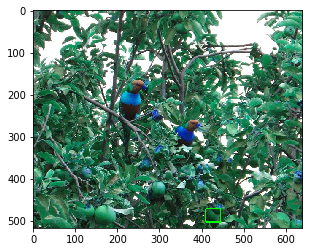

Category : airplane, Status : failure
Yes: 0, No: 1, N/A: 2
11775
Question                             True_Answer    WoQ    WoH    WH    WH_Bi    WH_Vision    WH_Q
---------------------------------  -------------  -----  -----  ----  -------  -----------  ------
is it a vehicle                                1      0      1     0        1            0       0
does it have stairs                            0      1      1     1        1            0       1
can you use it to get off a plane              0      0      0     0        1            0       0


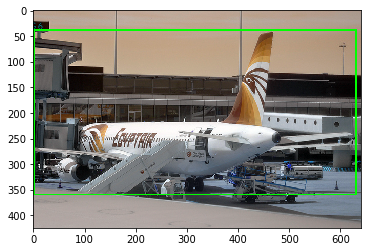

Category : carrot, Status : failure
Yes: 0, No: 1, N/A: 2
11777
Question                           True_Answer    WoQ    WoH    WH    WH_Bi    WH_Vision    WH_Q
-------------------------------  -------------  -----  -----  ----  -------  -----------  ------
is it a vegetable                            0      0      0     0        0            0       0
is it bottle shape                           1      1      1     1        1            1       1
is it green colour                           1      1      1     1        1            1       1
is it a radish                               1      1      1     1        1            1       1
is it orange colour                          0      1      0     0        0            0       0
is it in the middle of the bowl              0      0      1     1        1            1       1


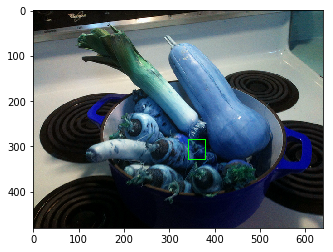

Category : potted plant, Status : failure
Yes: 0, No: 1, N/A: 2
11990
Question                          True_Answer    WoQ    WoH    WH    WH_Bi    WH_Vision    WH_Q
------------------------------  -------------  -----  -----  ----  -------  -----------  ------
is it one of the refrigerators              1      0      1     1        1            1       1
the first one on the right                  0      1      1     1        1            1       1
the whole of it                             1      0      1     1        0            1       1
just the top                                0      0      1     0        0            1       0


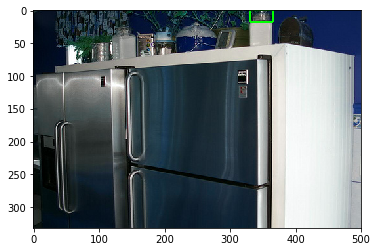

In [65]:
for i in [11771,11775,11777,11990]:#list_success[200:250]:
    img, questions, true_answers, pred_answers_WoQ, pred_answers_WoH, pred_answers_WH, pred_answers_WH_Bilstm, pred_answers_WH_QAsep, pred_answers_WH_OnlyQ, category, game_status, object_loc = evaluate_function(i)
    x,y,w,h = object_loc
    print("Category : %s, Status : %s" % (category_list[str(category)], game_status))
    print("Yes: 0, No: 1, N/A: 2")
    print(i)
    data = [["Question", "True_Answer", "WoQ", "WoH", "WH", "WH_Bi", "WH_Vision", "WH_Q"]]
    for i in range(len(questions)):
        data.append([questions[i], true_answers[i], pred_answers_WoQ[i], pred_answers_WoH[i], pred_answers_WH[i], pred_answers_WH_Bilstm[i], pred_answers_WH_QAsep[i], pred_answers_WH_OnlyQ[i]])
    print(tabulate(data[1:], headers=data[0]))
    img = cv2.rectangle(img, (int(x),int(y)), (int(w),int(h)),(0,255,0), 2)
    plt.imshow(img)
    plt.show()

Category : bottle, Status : failure
Yes: 0, No: 1, N/A: 2
11700
┌────────────────────────────────────────────────────────────────┬─────────────┬─────┬────┬───────┬──────────┬──────┐
│ Question                                                       │ True_Answer │ WoH │ WH │ WH_Bi │ WH_QAsep │ WH_Q │
├────────────────────────────────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it a bottle                                                 │           0 │   0 │  0 │     0 │        0 │    0 │
├────────────────────────────────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ blue/big on far left                                           │           1 │   1 │  1 │     1 │        1 │    1 │
├────────────────────────────────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ next one up small green one                                    │           1 │   0 │  1 │     1 │        1 │

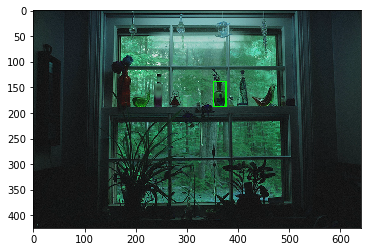

Category : chair, Status : failure
Yes: 0, No: 1, N/A: 2
11709
┌──────────────────────────────────────────┬─────────────┬─────┬────┬───────┬──────────┬──────┐
│ Question                                 │ True_Answer │ WoH │ WH │ WH_Bi │ WH_QAsep │ WH_Q │
├──────────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it the bus                            │           1 │   1 │  1 │     1 │        1 │    1 │
├──────────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it a person in the bus                │           1 │   1 │  1 │     1 │        1 │    1 │
├──────────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it part of the bus                    │           0 │   0 │  1 │     0 │        1 │    0 │
├──────────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it a picture                          │           1 │   1 │  1 │    

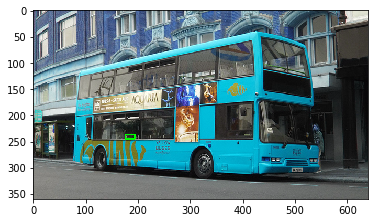

Category : horse, Status : failure
Yes: 0, No: 1, N/A: 2
11742
┌──────────────────────────────────────┬─────────────┬─────┬────┬───────┬──────────┬──────┐
│ Question                             │ True_Answer │ WoH │ WH │ WH_Bi │ WH_QAsep │ WH_Q │
├──────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it an animal                      │           0 │   0 │  0 │     0 │        0 │    0 │
├──────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it facing the camera              │           1 │   1 │  0 │     1 │        0 │    0 │
├──────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it on the right side of the photo │           0 │   1 │  1 │     1 │        1 │    1 │
├──────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it mostly white                   │           1 │   0 │  0 │     0 │        0 │    0 │
├────────────────

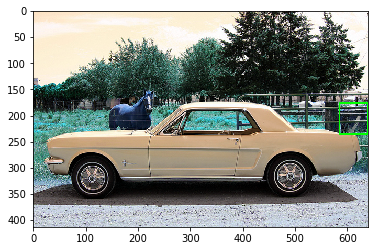

Category : apple, Status : failure
Yes: 0, No: 1, N/A: 2
11771
┌──────────────────────────────────────────────────┬─────────────┬─────┬────┬───────┬──────────┬──────┐
│ Question                                         │ True_Answer │ WoH │ WH │ WH_Bi │ WH_QAsep │ WH_Q │
├──────────────────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it a bird                                     │           1 │   1 │  1 │     1 │        1 │    1 │
├──────────────────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it fruit                                      │           0 │   0 │  0 │     0 │        0 │    0 │
├──────────────────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it a green apple                              │           0 │   1 │  1 │     0 │        1 │    1 │
├──────────────────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│

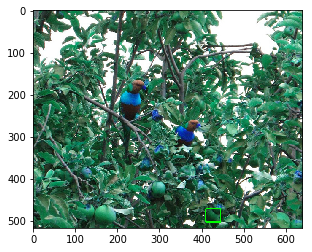

Category : airplane, Status : failure
Yes: 0, No: 1, N/A: 2
11775
┌───────────────────────────────────┬─────────────┬─────┬────┬───────┬──────────┬──────┐
│ Question                          │ True_Answer │ WoH │ WH │ WH_Bi │ WH_QAsep │ WH_Q │
├───────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it a vehicle                   │           1 │   1 │  0 │     1 │        0 │    0 │
├───────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ does it have stairs               │           0 │   1 │  1 │     1 │        1 │    1 │
├───────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ can you use it to get off a plane │           0 │   0 │  0 │     1 │        0 │    0 │
└───────────────────────────────────┴─────────────┴─────┴────┴───────┴──────────┴──────┘


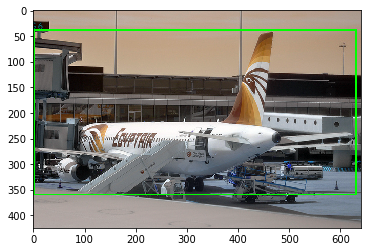

Category : carrot, Status : failure
Yes: 0, No: 1, N/A: 2
11777
┌─────────────────────────────────┬─────────────┬─────┬────┬───────┬──────────┬──────┐
│ Question                        │ True_Answer │ WoH │ WH │ WH_Bi │ WH_QAsep │ WH_Q │
├─────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it a vegetable               │           0 │   0 │  0 │     0 │        0 │    0 │
├─────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it bottle shape              │           1 │   1 │  1 │     1 │        1 │    1 │
├─────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it green colour              │           1 │   1 │  1 │     1 │        1 │    1 │
├─────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it a radish                  │           1 │   1 │  1 │     1 │        1 │    1 │
├─────────────────────────────────┼─────────────┼─────┼────┼──────

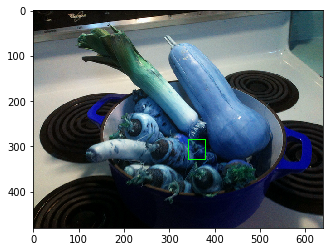

Category : person, Status : failure
Yes: 0, No: 1, N/A: 2
11781
┌─────────────┬─────────────┬─────┬────┬───────┬──────────┬──────┐
│ Question    │ True_Answer │ WoH │ WH │ WH_Bi │ WH_QAsep │ WH_Q │
├─────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is a person │           0 │   0 │  0 │     0 │        0 │    0 │
├─────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ on the boat │           0 │   0 │  0 │     0 │        1 │    0 │
├─────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ in black    │           2 │   1 │  1 │     1 │        1 │    1 │
└─────────────┴─────────────┴─────┴────┴───────┴──────────┴──────┘


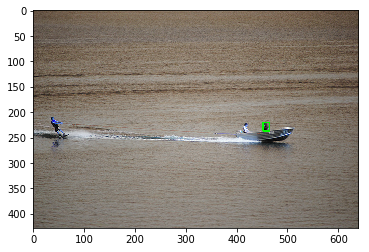

Category : chair, Status : failure
Yes: 0, No: 1, N/A: 2
11792
┌─────────────────────────────┬─────────────┬─────┬────┬───────┬──────────┬──────┐
│ Question                    │ True_Answer │ WoH │ WH │ WH_Bi │ WH_QAsep │ WH_Q │
├─────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it furniture             │           0 │   0 │  0 │     0 │        0 │    0 │
├─────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it the chair             │           0 │   0 │  0 │     0 │        0 │    0 │
├─────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it the arm of the chair  │           1 │   1 │  1 │     1 │        1 │    1 │
├─────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it the full chair itself │           0 │   0 │  0 │     0 │        0 │    0 │
└─────────────────────────────┴─────────────┴─────┴────┴───────┴──────────┴──────┘


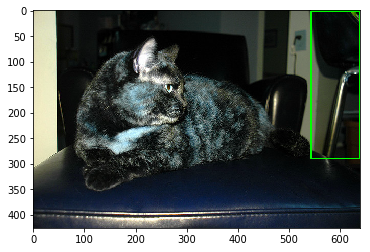

Category : person, Status : failure
Yes: 0, No: 1, N/A: 2
11794
┌─────────────────────────────────────────┬─────────────┬─────┬────┬───────┬──────────┬──────┐
│ Question                                │ True_Answer │ WoH │ WH │ WH_Bi │ WH_QAsep │ WH_Q │
├─────────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it a person                          │           0 │   0 │  0 │     0 │        0 │    0 │
├─────────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ are they far left                       │           1 │   1 │  1 │     1 │        1 │    1 │
├─────────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ are they on bus                         │           0 │   0 │  0 │     0 │        0 │    0 │
├─────────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ are they in first two windows far left  │           1 │   1 │  1 │     1 │     

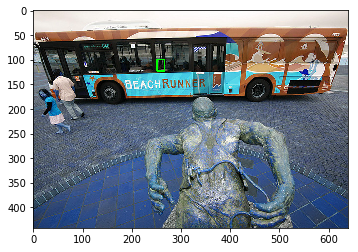

Category : person, Status : failure
Yes: 0, No: 1, N/A: 2
11813
┌─────────────────────────────────────────────────────┬─────────────┬─────┬────┬───────┬──────────┬──────┐
│ Question                                            │ True_Answer │ WoH │ WH │ WH_Bi │ WH_QAsep │ WH_Q │
├─────────────────────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it human                                         │           0 │   0 │  0 │     0 │        0 │    0 │
├─────────────────────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it wearing red                                   │           1 │   1 │  1 │     1 │        1 │    1 │
├─────────────────────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it wearing white                                 │           1 │   1 │  1 │     1 │        1 │    1 │
├─────────────────────────────────────────────────────┼─────────────┼─────┼────┼

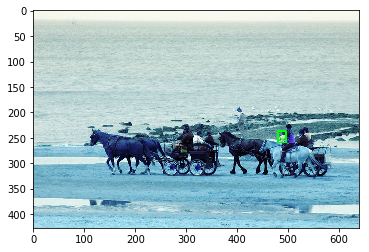

Category : bench, Status : failure
Yes: 0, No: 1, N/A: 2
11821
┌──────────────────────────────────────┬─────────────┬─────┬────┬───────┬──────────┬──────┐
│ Question                             │ True_Answer │ WoH │ WH │ WH_Bi │ WH_QAsep │ WH_Q │
├──────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it human                          │           1 │   1 │  1 │     1 │        1 │    1 │
├──────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it a soccer ball                  │           1 │   1 │  1 │     1 │        1 │    1 │
├──────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it something connected to a human │           1 │   1 │  1 │     1 │        1 │    1 │
├──────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it in the background              │           0 │   1 │  1 │     1 │        1 │    1 │
├────────────────

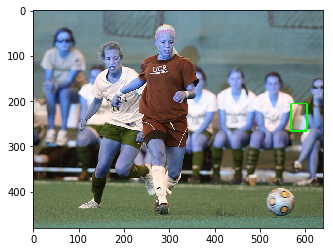

Category : donut, Status : failure
Yes: 0, No: 1, N/A: 2
11843
┌───────────────────────────────────────────────────┬─────────────┬─────┬────┬───────┬──────────┬──────┐
│ Question                                          │ True_Answer │ WoH │ WH │ WH_Bi │ WH_QAsep │ WH_Q │
├───────────────────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it edible                                      │           0 │   0 │  0 │     0 │        0 │    0 │
├───────────────────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ does it have jam in it                            │           1 │   1 │  1 │     1 │        1 │    1 │
├───────────────────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ does it have dusted sugar                         │           0 │   1 │  1 │     0 │        1 │    1 │
├───────────────────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼

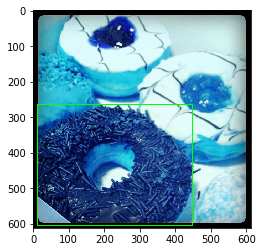

Category : person, Status : failure
Yes: 0, No: 1, N/A: 2
11852
┌────────────────┬─────────────┬─────┬────┬───────┬──────────┬──────┐
│ Question       │ True_Answer │ WoH │ WH │ WH_Bi │ WH_QAsep │ WH_Q │
├────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it a person │           0 │   0 │  0 │     0 │        0 │    0 │
├────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ in the middle  │           1 │   0 │  1 │     0 │        1 │    0 │
├────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ on the right   │           0 │   1 │  1 │     1 │        1 │    1 │
├────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ the far right  │           1 │   1 │  1 │     1 │        1 │    1 │
└────────────────┴─────────────┴─────┴────┴───────┴──────────┴──────┘


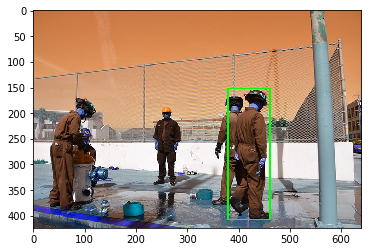

Category : suitcase, Status : failure
Yes: 0, No: 1, N/A: 2
11862
┌───────────────────────────────────────┬─────────────┬─────┬────┬───────┬──────────┬──────┐
│ Question                              │ True_Answer │ WoH │ WH │ WH_Bi │ WH_QAsep │ WH_Q │
├───────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it one of the three black luggages │           0 │   1 │  0 │     0 │        0 │    0 │
├───────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it one of the two big ones         │           0 │   1 │  1 │     1 │        1 │    1 │
├───────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it the large one                   │           1 │   1 │  1 │     1 │        1 │    1 │
└───────────────────────────────────────┴─────────────┴─────┴────┴───────┴──────────┴──────┘


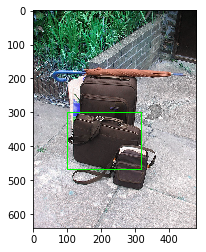

Category : person, Status : failure
Yes: 0, No: 1, N/A: 2
11868
┌──────────────┬─────────────┬─────┬────┬───────┬──────────┬──────┐
│ Question     │ True_Answer │ WoH │ WH │ WH_Bi │ WH_QAsep │ WH_Q │
├──────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it pink   │           1 │   1 │  1 │     1 │        1 │    1 │
├──────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it alive  │           0 │   0 │  0 │     0 │        0 │    0 │
├──────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it a male │           0 │   0 │  1 │     0 │        0 │    0 │
├──────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it bald   │           1 │   1 │  0 │     0 │        0 │    0 │
└──────────────┴─────────────┴─────┴────┴───────┴──────────┴──────┘


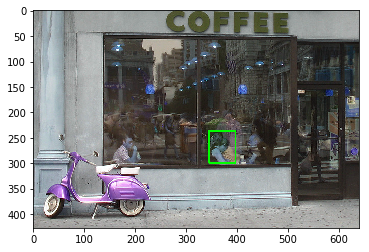

Category : person, Status : failure
Yes: 0, No: 1, N/A: 2
11898
┌───────────────────────┬─────────────┬─────┬────┬───────┬──────────┬──────┐
│ Question              │ True_Answer │ WoH │ WH │ WH_Bi │ WH_QAsep │ WH_Q │
├───────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ a bus                 │           1 │   1 │  1 │     1 │        1 │    1 │
├───────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ a person              │           0 │   0 │  0 │     0 │        0 │    0 │
├───────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ in blue with umbrella │           1 │   1 │  1 │     1 │        1 │    1 │
├───────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ extreme left          │           0 │   1 │  1 │     1 │        1 │    1 │
└───────────────────────┴─────────────┴─────┴────┴───────┴──────────┴──────┘


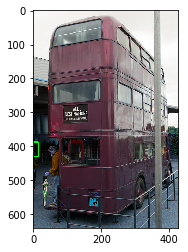

Category : bottle, Status : failure
Yes: 0, No: 1, N/A: 2
11901
┌───────────────────────────────────────┬─────────────┬─────┬────┬───────┬──────────┬──────┐
│ Question                              │ True_Answer │ WoH │ WH │ WH_Bi │ WH_QAsep │ WH_Q │
├───────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it in the middle of the photo      │           1 │   1 │  1 │     1 │        1 │    1 │
├───────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it beige                           │           1 │   0 │  1 │     0 │        1 │    0 │
├───────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it a bottle                        │           0 │   0 │  0 │     0 │        0 │    0 │
├───────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ does it have a red lid                │           1 │   0 │  0 │     0 │        0 │    0 │
├─────

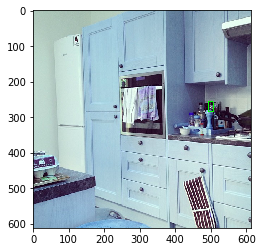

Category : cup, Status : failure
Yes: 0, No: 1, N/A: 2
11918
┌───────────────────────────────┬─────────────┬─────┬────┬───────┬──────────┬──────┐
│ Question                      │ True_Answer │ WoH │ WH │ WH_Bi │ WH_QAsep │ WH_Q │
├───────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it the towel on the fridge │           1 │   1 │  1 │     1 │        1 │    1 │
├───────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it the chair               │           1 │   1 │  1 │     1 │        1 │    1 │
├───────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is the the electric stove     │           1 │   1 │  1 │     1 │        1 │    1 │
├───────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it the cabinet             │           0 │   1 │  1 │     1 │        1 │    1 │
├───────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is

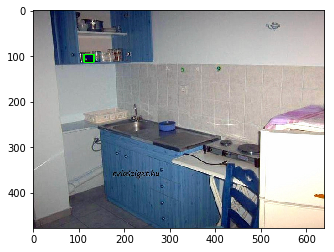

Category : banana, Status : failure
Yes: 0, No: 1, N/A: 2
11928
┌───────────────────────────────────────────────────────┬─────────────┬─────┬────┬───────┬──────────┬──────┐
│ Question                                              │ True_Answer │ WoH │ WH │ WH_Bi │ WH_QAsep │ WH_Q │
├───────────────────────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it food                                            │           0 │   0 │  0 │     0 │        0 │    0 │
├───────────────────────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it one banana                                      │           0 │   0 │  0 │     0 │        0 │    0 │
├───────────────────────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it on top                                          │           1 │   0 │  0 │     0 │        0 │    0 │
├───────────────────────────────────────────────────────┼───────

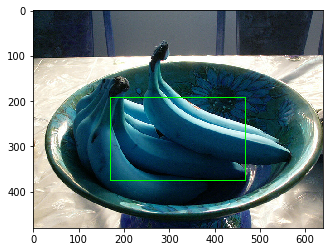

Category : bus, Status : failure
Yes: 0, No: 1, N/A: 2
11934
┌─────────────────────────────┬─────────────┬─────┬────┬───────┬──────────┬──────┐
│ Question                    │ True_Answer │ WoH │ WH │ WH_Bi │ WH_QAsep │ WH_Q │
├─────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it a vehicle             │           0 │   0 │  0 │     0 │        0 │    0 │
├─────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it the double decker bus │           0 │   1 │  1 │     0 │        0 │    1 │
└─────────────────────────────┴─────────────┴─────┴────┴───────┴──────────┴──────┘


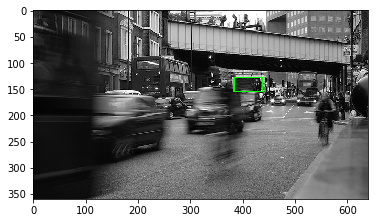

Category : person, Status : failure
Yes: 0, No: 1, N/A: 2
11937
┌───────────────────────────────────────┬─────────────┬─────┬────┬───────┬──────────┬──────┐
│ Question                              │ True_Answer │ WoH │ WH │ WH_Bi │ WH_QAsep │ WH_Q │
├───────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it a person                        │           0 │   0 │  0 │     0 │        0 │    0 │
├───────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it someone in the foreground       │           1 │   0 │  0 │     0 │        0 │    0 │
├───────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it some standing in the background │           0 │   0 │  0 │     0 │        0 │    0 │
├───────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it the man in the yellow shirt     │           1 │   0 │  0 │     0 │        0 │    0 │
├─────

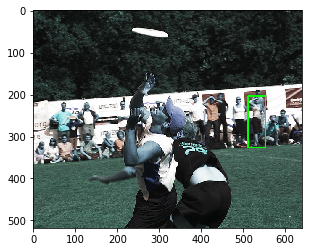

Category : car, Status : failure
Yes: 0, No: 1, N/A: 2
11939
┌──────────────────────────┬─────────────┬─────┬────┬───────┬──────────┬──────┐
│ Question                 │ True_Answer │ WoH │ WH │ WH_Bi │ WH_QAsep │ WH_Q │
├──────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it human              │           1 │   1 │  1 │     1 │        1 │    1 │
├──────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it electronic         │           1 │   1 │  1 │     1 │        1 │    1 │
├──────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it on the table       │           1 │   1 │  1 │     1 │        1 │    1 │
├──────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it outside the window │           0 │   1 │  1 │     1 │        1 │    1 │
├──────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it a building         │           1 │   1 │  1 │     1

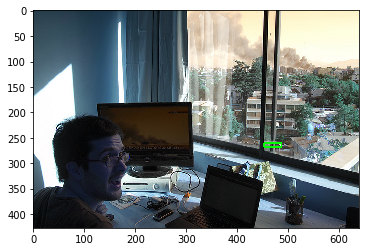

Category : skis, Status : failure
Yes: 0, No: 1, N/A: 2
11968
┌──────────────────┬─────────────┬─────┬────┬───────┬──────────┬──────┐
│ Question         │ True_Answer │ WoH │ WH │ WH_Bi │ WH_QAsep │ WH_Q │
├──────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it the person │           1 │   1 │  1 │     1 │        1 │    1 │
├──────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ skis             │           0 │   0 │  0 │     0 │        0 │    0 │
├──────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ both of them     │           0 │   0 │  1 │     1 │        1 │    1 │
└──────────────────┴─────────────┴─────┴────┴───────┴──────────┴──────┘


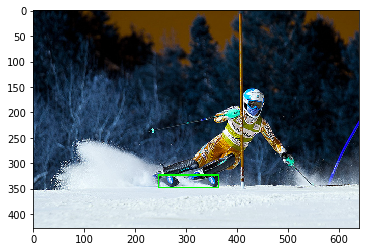

Category : person, Status : failure
Yes: 0, No: 1, N/A: 2
11975
┌─────────────────────────────────────────────────┬─────────────┬─────┬────┬───────┬──────────┬──────┐
│ Question                                        │ True_Answer │ WoH │ WH │ WH_Bi │ WH_QAsep │ WH_Q │
├─────────────────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it a person                                  │           0 │   0 │  0 │     0 │        0 │    0 │
├─────────────────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it the person on the skateboard              │           1 │   1 │  1 │     1 │        1 │    1 │
├─────────────────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it the person on the right in the background │           0 │   1 │  1 │     1 │        1 │    1 │
└─────────────────────────────────────────────────┴─────────────┴─────┴────┴───────┴──────────┴──────┘


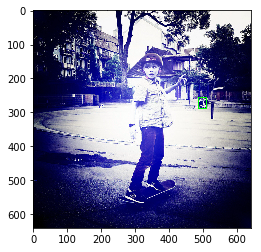

Category : broccoli, Status : failure
Yes: 0, No: 1, N/A: 2
11976
┌───────────────────────────────────────────────────────────────────────────────────────┬─────────────┬─────┬────┬───────┬──────────┬──────┐
│ Question                                                                              │ True_Answer │ WoH │ WH │ WH_Bi │ WH_QAsep │ WH_Q │
├───────────────────────────────────────────────────────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it food                                                                            │           0 │   0 │  0 │     0 │        0 │    0 │
├───────────────────────────────────────────────────────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it a single piece of food                                                          │           0 │   0 │  0 │     0 │        0 │    0 │
├───────────────────────────────────────────────────────────────────────────────────────

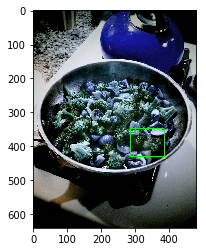

Category : pizza, Status : failure
Yes: 0, No: 1, N/A: 2
11983
┌────────────────────────┬─────────────┬─────┬────┬───────┬──────────┬──────┐
│ Question               │ True_Answer │ WoH │ WH │ WH_Bi │ WH_QAsep │ WH_Q │
├────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it food             │           0 │   0 │  0 │     0 │        0 │    0 │
├────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it pizza            │           0 │   0 │  0 │     0 │        0 │    0 │
├────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it a specific slice │           1 │   0 │  0 │     0 │        0 │    0 │
└────────────────────────┴─────────────┴─────┴────┴───────┴──────────┴──────┘


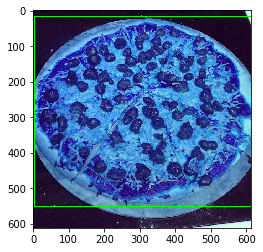

Category : potted plant, Status : failure
Yes: 0, No: 1, N/A: 2
11990
┌────────────────────────────────┬─────────────┬─────┬────┬───────┬──────────┬──────┐
│ Question                       │ True_Answer │ WoH │ WH │ WH_Bi │ WH_QAsep │ WH_Q │
├────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it one of the refrigerators │           1 │   1 │  1 │     1 │        1 │    1 │
├────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ the first one on the right     │           0 │   1 │  1 │     1 │        1 │    1 │
├────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ the whole of it                │           1 │   1 │  1 │     0 │        1 │    1 │
├────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ just the top                   │           0 │   1 │  0 │     0 │        1 │    0 │
└────────────────────────────────┴─────────────┴─────┴────┴───────┴───

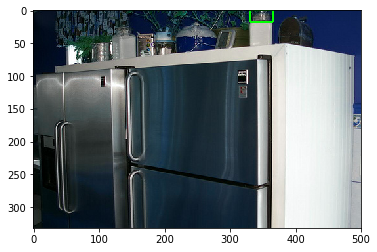

Category : broccoli, Status : failure
Yes: 0, No: 1, N/A: 2
12013
┌─────────────────────┬─────────────┬─────┬────┬───────┬──────────┬──────┐
│ Question            │ True_Answer │ WoH │ WH │ WH_Bi │ WH_QAsep │ WH_Q │
├─────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it a food        │           0 │   0 │  0 │     0 │        0 │    0 │
├─────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it a green piece │           0 │   0 │  0 │     0 │        0 │    0 │
├─────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it on the right  │           1 │   1 │  1 │     1 │        1 │    1 │
├─────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it in left side  │           0 │   1 │  1 │     1 │        1 │    1 │
└─────────────────────┴─────────────┴─────┴────┴───────┴──────────┴──────┘


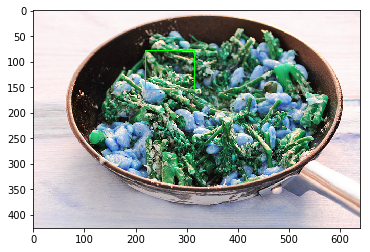

Category : cow, Status : failure
Yes: 0, No: 1, N/A: 2
12014
┌────────────────────────────────────┬─────────────┬─────┬────┬───────┬──────────┬──────┐
│ Question                           │ True_Answer │ WoH │ WH │ WH_Bi │ WH_QAsep │ WH_Q │
├────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it a cow                        │           0 │   0 │  0 │     0 │        0 │    0 │
├────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ the black and white cow            │           1 │   0 │  1 │     1 │        1 │    0 │
├────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it the blonde cow in the middle │           1 │   1 │  1 │     1 │        1 │    1 │
└────────────────────────────────────┴─────────────┴─────┴────┴───────┴──────────┴──────┘


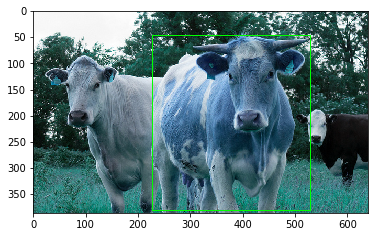

Category : book, Status : failure
Yes: 0, No: 1, N/A: 2
12016
┌────────────────────┬─────────────┬─────┬────┬───────┬──────────┬──────┐
│ Question           │ True_Answer │ WoH │ WH │ WH_Bi │ WH_QAsep │ WH_Q │
├────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it on the table │           1 │   0 │  0 │     0 │        0 │    0 │
├────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it a black      │           1 │   1 │  1 │     1 │        1 │    1 │
├────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it a text       │           0 │   1 │  1 │     1 │        1 │    1 │
├────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it a right side │           0 │   1 │  1 │     1 │        1 │    1 │
├────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it a standing   │           1 │   0 │  0 │     0 │        0 │    0 │
├────────────────────┼─────────────┼─────┼────┼───

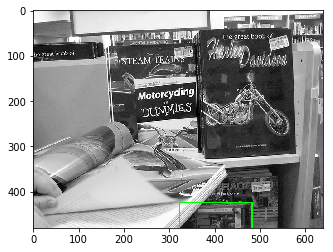

Category : car, Status : failure
Yes: 0, No: 1, N/A: 2
12022
┌───────────────────────────┬─────────────┬─────┬────┬───────┬──────────┬──────┐
│ Question                  │ True_Answer │ WoH │ WH │ WH_Bi │ WH_QAsep │ WH_Q │
├───────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is a person               │           1 │   1 │  1 │     1 │        1 │    1 │
├───────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is a car                  │           0 │   0 │  0 │     0 │        0 │    0 │
├───────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is a red car              │           1 │   1 │  1 │     1 │        1 │    1 │
├───────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is the car parking        │           2 │   0 │  0 │     0 │        0 │    0 │
├───────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ the car is in the parking │           0 │   0 

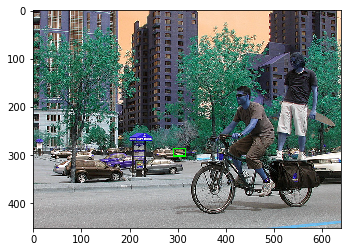

Category : car, Status : failure
Yes: 0, No: 1, N/A: 2
12024
┌────────────────────┬─────────────┬─────┬────┬───────┬──────────┬──────┐
│ Question           │ True_Answer │ WoH │ WH │ WH_Bi │ WH_QAsep │ WH_Q │
├────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it person       │           1 │   1 │  1 │     1 │        1 │    1 │
├────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it car          │           0 │   0 │  0 │     0 │        0 │    0 │
├────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it front one    │           1 │   1 │  1 │     1 │        1 │    1 │
├────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it back to that │           0 │   0 │  0 │     0 │        0 │    0 │
└────────────────────┴─────────────┴─────┴────┴───────┴──────────┴──────┘


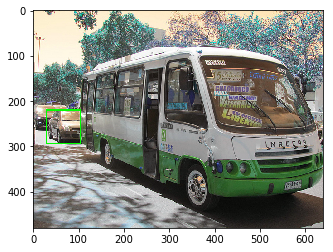

Category : truck, Status : failure
Yes: 0, No: 1, N/A: 2
12037
┌────────────────────────────────┬─────────────┬─────┬────┬───────┬──────────┬──────┐
│ Question                       │ True_Answer │ WoH │ WH │ WH_Bi │ WH_QAsep │ WH_Q │
├────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is a car                       │           0 │   0 │  0 │     0 │        0 │    0 │
├────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is one of the two on the front │           1 │   0 │  0 │     0 │        0 │    0 │
├────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it yellow                   │           1 │   1 │  1 │     1 │        1 │    1 │
└────────────────────────────────┴─────────────┴─────┴────┴───────┴──────────┴──────┘


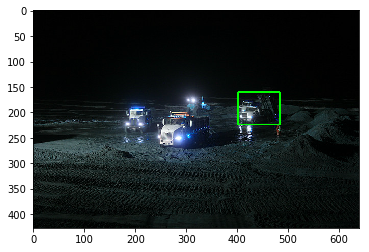

Category : person, Status : failure
Yes: 0, No: 1, N/A: 2
12058
┌─────────────────────────────────────────────────────┬─────────────┬─────┬────┬───────┬──────────┬──────┐
│ Question                                            │ True_Answer │ WoH │ WH │ WH_Bi │ WH_QAsep │ WH_Q │
├─────────────────────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ person                                              │           0 │   0 │  0 │     0 │        0 │    0 │
├─────────────────────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ in front                                            │           1 │   0 │  0 │     0 │        0 │    0 │
├─────────────────────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ the man on the left edge                            │           1 │   1 │  1 │     1 │        1 │    1 │
├─────────────────────────────────────────────────────┼─────────────┼─────┼────┼

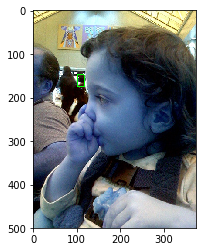

Category : teddy bear, Status : failure
Yes: 0, No: 1, N/A: 2
12062
┌────────────────────┬─────────────┬─────┬────┬───────┬──────────┬──────┐
│ Question           │ True_Answer │ WoH │ WH │ WH_Bi │ WH_QAsep │ WH_Q │
├────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it a teddy bear │           0 │   0 │  0 │     0 │        0 │    0 │
├────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it sitting      │           0 │   1 │  1 │     1 │        1 │    1 │
├────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it small        │           0 │   0 │  1 │     0 │        0 │    0 │
├────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it white        │           1 │   0 │  0 │     0 │        0 │    0 │
├────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it in front     │           0 │   0 │  0 │     0 │        0 │    0 │
└────────────────────┴─────────────┴─────┴──

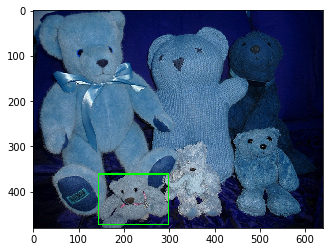

Category : person, Status : failure
Yes: 0, No: 1, N/A: 2
12068
┌────────────────────────────────────────┬─────────────┬─────┬────┬───────┬──────────┬──────┐
│ Question                               │ True_Answer │ WoH │ WH │ WH_Bi │ WH_QAsep │ WH_Q │
├────────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it an umbrella                      │           1 │   1 │  1 │     1 │        1 │    1 │
├────────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it the girl                         │           1 │   1 │  0 │     0 │        0 │    0 │
├────────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it on the girl                      │           1 │   1 │  1 │     1 │        1 │    1 │
├────────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it the tree top right               │           1 │   1 │  1 │     1 │        1 │    

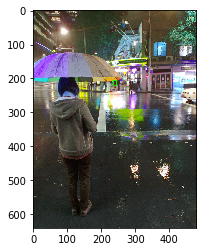

Category : vase, Status : failure
Yes: 0, No: 1, N/A: 2
12076
┌────────────────────────────┬─────────────┬─────┬────┬───────┬──────────┬──────┐
│ Question                   │ True_Answer │ WoH │ WH │ WH_Bi │ WH_QAsep │ WH_Q │
├────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it a toilet             │           1 │   1 │  1 │     1 │        1 │    1 │
├────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it a towel              │           1 │   1 │  1 │     1 │        1 │    1 │
├────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it a flower             │           1 │   1 │  1 │     1 │        1 │    1 │
├────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it a red                │           1 │   1 │  1 │     1 │        1 │    1 │
├────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it a door screen        │      

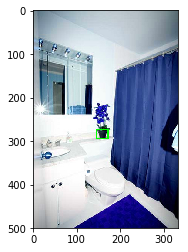

Category : cup, Status : failure
Yes: 0, No: 1, N/A: 2
12087
┌──────────┬─────────────┬─────┬────┬───────┬──────────┬──────┐
│ Question │ True_Answer │ WoH │ WH │ WH_Bi │ WH_QAsep │ WH_Q │
├──────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is a dog │           1 │   1 │  1 │     1 │        1 │    1 │
├──────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ person   │           1 │   1 │  1 │     1 │        1 │    1 │
├──────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ truck    │           1 │   1 │  1 │     1 │        1 │    1 │
├──────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ can      │           1 │   1 │  0 │     1 │        1 │    0 │
└──────────┴─────────────┴─────┴────┴───────┴──────────┴──────┘


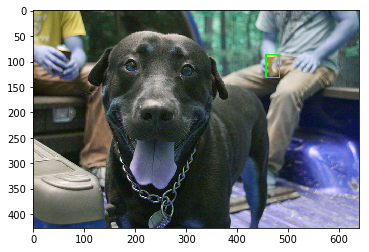

Category : potted plant, Status : failure
Yes: 0, No: 1, N/A: 2
12090
┌────────────┬─────────────┬─────┬────┬───────┬──────────┬──────┐
│ Question   │ True_Answer │ WoH │ WH │ WH_Bi │ WH_QAsep │ WH_Q │
├────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is a vase  │           0 │   1 │  1 │     1 │        1 │    1 │
├────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ the shadow │           1 │   1 │  1 │     1 │        0 │    1 │
└────────────┴─────────────┴─────┴────┴───────┴──────────┴──────┘


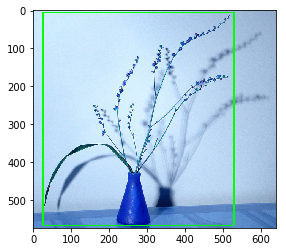

Category : carrot, Status : failure
Yes: 0, No: 1, N/A: 2
12096
┌─────────────────────────────────────────────────┬─────────────┬─────┬────┬───────┬──────────┬──────┐
│ Question                                        │ True_Answer │ WoH │ WH │ WH_Bi │ WH_QAsep │ WH_Q │
├─────────────────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it in the bowl                               │           0 │   1 │  0 │     0 │        0 │    0 │
├─────────────────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it pizza                                     │           1 │   1 │  1 │     1 │        1 │    1 │
├─────────────────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it green                                     │           1 │   1 │  1 │     1 │        1 │    1 │
├─────────────────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it c

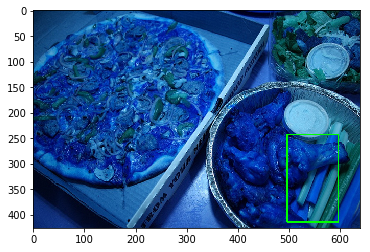

Category : apple, Status : failure
Yes: 0, No: 1, N/A: 2
12098
┌────────────────────────────────────────┬─────────────┬─────┬────┬───────┬──────────┬──────┐
│ Question                               │ True_Answer │ WoH │ WH │ WH_Bi │ WH_QAsep │ WH_Q │
├────────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it food                             │           0 │   0 │  0 │     0 │        0 │    0 │
├────────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it one apple                        │           0 │   0 │  0 │     0 │        0 │    0 │
├────────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it in the box closest to the camera │           0 │   1 │  1 │     1 │        1 │    1 │
├────────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it in the right side of the box     │           0 │   0 │  1 │     1 │        0 │    1

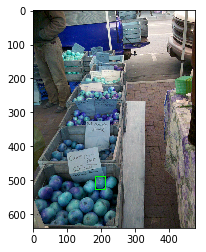

Category : tennis racket, Status : failure
Yes: 0, No: 1, N/A: 2
12114
┌───────────────────────────┬─────────────┬─────┬────┬───────┬──────────┬──────┐
│ Question                  │ True_Answer │ WoH │ WH │ WH_Bi │ WH_QAsep │ WH_Q │
├───────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it human               │           1 │   1 │  1 │     1 │        1 │    1 │
├───────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it a racquet           │           0 │   0 │  0 │     0 │        0 │    0 │
├───────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it held above the head │           1 │   0 │  0 │     0 │        0 │    0 │
├───────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it held by a blonde    │           1 │   0 │  0 │     0 │        0 │    0 │
└───────────────────────────┴─────────────┴─────┴────┴───────┴──────────┴──────┘


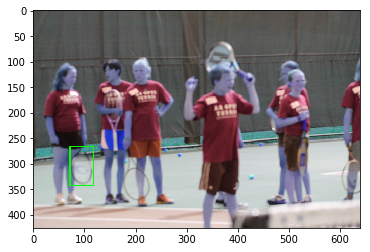

Category : scissors, Status : failure
Yes: 0, No: 1, N/A: 2
12115
┌────────────────┬─────────────┬─────┬────┬───────┬──────────┬──────┐
│ Question       │ True_Answer │ WoH │ WH │ WH_Bi │ WH_QAsep │ WH_Q │
├────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it in front │           0 │   0 │  0 │     0 │        0 │    0 │
├────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it person   │           1 │   1 │  1 │     1 │        1 │    1 │
├────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it scissor  │           0 │   0 │  0 │     0 │        0 │    0 │
└────────────────┴─────────────┴─────┴────┴───────┴──────────┴──────┘


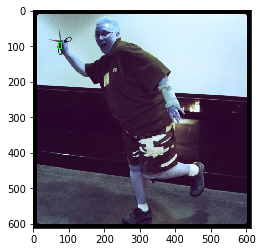

Category : chair, Status : failure
Yes: 0, No: 1, N/A: 2
12127
┌────────────────────────────┬─────────────┬─────┬────┬───────┬──────────┬──────┐
│ Question                   │ True_Answer │ WoH │ WH │ WH_Bi │ WH_QAsep │ WH_Q │
├────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it a piece of furniture │           0 │   0 │  0 │     0 │        0 │    0 │
├────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it a chair              │           0 │   0 │  0 │     0 │        0 │    0 │
├────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it red                  │           1 │   1 │  1 │     1 │        1 │    1 │
├────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it on the far left      │           1 │   1 │  1 │     1 │        1 │    1 │
└────────────────────────────┴─────────────┴─────┴────┴───────┴──────────┴──────┘


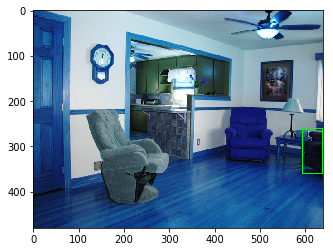

Category : car, Status : failure
Yes: 0, No: 1, N/A: 2
12142
┌─────────────────────────────────────────────────────────────┬─────────────┬─────┬────┬───────┬──────────┬──────┐
│ Question                                                    │ True_Answer │ WoH │ WH │ WH_Bi │ WH_QAsep │ WH_Q │
├─────────────────────────────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it a dog                                                 │           1 │   1 │  1 │     1 │        1 │    1 │
├─────────────────────────────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it a car                                                 │           0 │   0 │  0 │     0 │        0 │    0 │
├─────────────────────────────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it the front one                                         │           1 │   1 │  1 │     1 │        1 │    1 │
├──────────────────

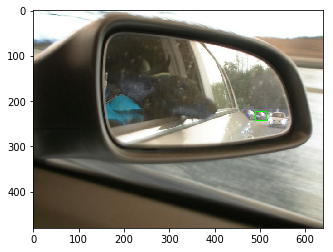

Category : person, Status : failure
Yes: 0, No: 1, N/A: 2
12155
┌────────────────────────────────────────────────────────────────────────────┬─────────────┬─────┬────┬───────┬──────────┬──────┐
│ Question                                                                   │ True_Answer │ WoH │ WH │ WH_Bi │ WH_QAsep │ WH_Q │
├────────────────────────────────────────────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it a person or a body part                                              │           0 │   0 │  0 │     0 │        0 │    0 │
├────────────────────────────────────────────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is he wearing blue cap                                                     │           1 │   0 │  1 │     1 │        1 │    0 │
├────────────────────────────────────────────────────────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is he wearing white cap 

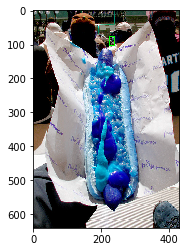

Category : vase, Status : failure
Yes: 0, No: 1, N/A: 2
12177
┌────────────────┬─────────────┬─────┬────┬───────┬──────────┬──────┐
│ Question       │ True_Answer │ WoH │ WH │ WH_Bi │ WH_QAsep │ WH_Q │
├────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it person   │           1 │   1 │  1 │     1 │        1 │    1 │
├────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it in left  │           1 │   1 │  1 │     1 │        1 │    1 │
├────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it in front │           0 │   1 │  1 │     1 │        1 │    1 │
├────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it red rose │           1 │   0 │  1 │     1 │        1 │    0 │
├────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it vase     │           0 │   0 │  0 │     0 │        0 │    0 │
└────────────────┴─────────────┴─────┴────┴───────┴──────────┴──────┘


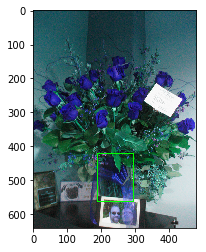

Category : person, Status : failure
Yes: 0, No: 1, N/A: 2
12183
┌───────────────────────────┬─────────────┬─────┬────┬───────┬──────────┬──────┐
│ Question                  │ True_Answer │ WoH │ WH │ WH_Bi │ WH_QAsep │ WH_Q │
├───────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it a person            │           0 │   0 │  0 │     0 │        0 │    0 │
├───────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is the person a spectator │           1 │   0 │  0 │     0 │        1 │    0 │
└───────────────────────────┴─────────────┴─────┴────┴───────┴──────────┴──────┘


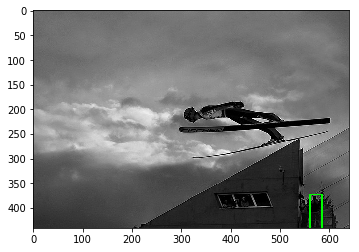

Category : toothbrush, Status : failure
Yes: 0, No: 1, N/A: 2
12195
┌─────────────────────────┬─────────────┬─────┬────┬───────┬──────────┬──────┐
│ Question                │ True_Answer │ WoH │ WH │ WH_Bi │ WH_QAsep │ WH_Q │
├─────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it a human being     │           1 │   1 │  1 │     1 │        1 │    1 │
├─────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it the blanket quilt │           1 │   1 │  1 │     1 │        1 │    1 │
├─────────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ brush he is holding     │           0 │   0 │  1 │     1 │        1 │    1 │
└─────────────────────────┴─────────────┴─────┴────┴───────┴──────────┴──────┘


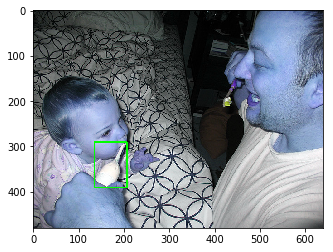

Category : suitcase, Status : failure
Yes: 0, No: 1, N/A: 2
12200
┌───────────────────────┬─────────────┬─────┬────┬───────┬──────────┬──────┐
│ Question              │ True_Answer │ WoH │ WH │ WH_Bi │ WH_QAsep │ WH_Q │
├───────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it on the suitcase │           0 │   1 │  1 │     1 │        1 │    1 │
├───────────────────────┼─────────────┼─────┼────┼───────┼──────────┼──────┤
│ is it black           │           0 │   1 │  1 │     0 │        0 │    0 │
└───────────────────────┴─────────────┴─────┴────┴───────┴──────────┴──────┘


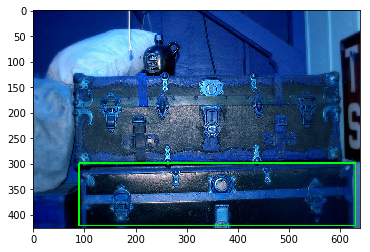

In [19]:
for i in list_success[100:1250]:
    img, questions, true_answers, pred_answers_WoH, pred_answers_WH, pred_answers_WH_Bilstm, pred_answers_WH_QAsep, pred_answers_WH_OnlyQ, category, game_status, object_loc = evaluate_function(i)
    x,y,w,h = object_loc
    print("Category : %s, Status : %s" % (category_list[str(category)], game_status))
    print("Yes: 0, No: 1, N/A: 2")
    print(i)
    data = [["Question", "True_Answer", "WoH", "WH", "WH_Bi", "WH_QAsep", "WH_Q"]]
    for i in range(len(questions)):
        data.append([questions[i], true_answers[i], pred_answers_WoH[i], pred_answers_WH[i], pred_answers_WH_Bilstm[i], pred_answers_WH_QAsep[i], pred_answers_WH_OnlyQ[i]])
    print(to_text(data))
    img = cv2.rectangle(img, (int(x),int(y)), (int(w),int(h)),(0,255,0), 2)
    plt.imshow(img)
    plt.show()

In [14]:
img, questions, true_answers, pred_answers_WoH, pred_answers_WH, pred_answers_WH_Bilstm, category, game_status, object_loc = evaluate_function(500)

Category : bench, Status : failure
Yes: 0, No: 1, N/A: 2
┌───────────────────────────────────────────────────────────────────┬──────────┬─────┬────┬───────┬──────────┬──────┐
│ Question                                                          │ True_Ans │ WoH │ WH │ WH_Bi │ WH_QAsep │ WH_Q │
├───────────────────────────────────────────────────────────────────┼──────────┼─────┼────┼───────┼──────────┼──────┤
│ is it producing light                                             │        1 │   1 │  1 │     1 │        1 │    1 │
├───────────────────────────────────────────────────────────────────┼──────────┼─────┼────┼───────┼──────────┼──────┤
│ is it in the left hand side of the picture                        │        1 │   1 │  0 │     0 │        0 │    0 │
├───────────────────────────────────────────────────────────────────┼──────────┼─────┼────┼───────┼──────────┼──────┤
│ is it in the right hand side of the picture                       │        0 │   1 │  1 │     1 │        1 │    1 │

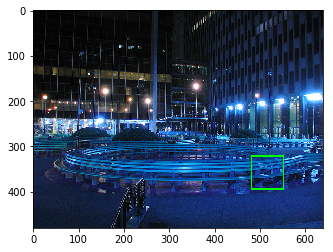

In [16]:
img, questions, true_answers, pred_answers_WoH, pred_answers_WH, pred_answers_WH_Bilstm, pred_answers_WH_QAsep, pred_answers_WH_OnlyQ, category, game_status, object_loc = evaluate_function(500)
x,y,w,h = object_loc
print("Category : %s, Status : %s" % (category_list[str(category)], game_status))
print("Yes: 0, No: 1, N/A: 2")
data = [["Question", "True_Ans", "WoH", "WH", "WH_Bi", "WH_QAsep", "WH_Q"]]
for i in range(len(questions)):
    data.append([questions[i], true_answers[i], pred_answers_WoH[i], pred_answers_WH[i], pred_answers_WH_Bilstm[i], pred_answers_WH_QAsep[i], pred_answers_WH_OnlyQ[i]])
print(to_text(data))
img = cv2.rectangle(img, (int(x),int(y)), (int(w),int(h)),(0,255,0), 2)
plt.imshow(img)
plt.show()

Category : clock, Status : failure
┌─────────────────────┬────────┬──────────┬─────────┬────────────┐
│ Question            │ Answer │ Pred_woH │ Pred_wH │ Pred_wH_Bi │
├─────────────────────┼────────┼──────────┼─────────┼────────────┤
│ is it a clock       │      0 │        1 │       0 │          1 │
├─────────────────────┼────────┼──────────┼─────────┼────────────┤
│ is it a tower       │      0 │        1 │       1 │          1 │
├─────────────────────┼────────┼──────────┼─────────┼────────────┤
│ is it a clock tower │      0 │        0 │       0 │          0 │
└─────────────────────┴────────┴──────────┴─────────┴────────────┘


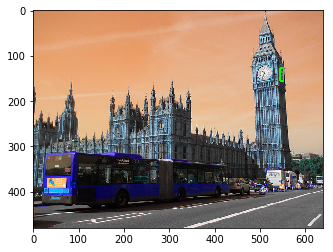

Category : mouse, Status : failure
┌──────────────────────────────────┬────────┬──────────┬─────────┬────────────┐
│ Question                         │ Answer │ Pred_woH │ Pred_wH │ Pred_wH_Bi │
├──────────────────────────────────┼────────┼──────────┼─────────┼────────────┤
│ is it electronic                 │      0 │        0 │       0 │          0 │
├──────────────────────────────────┼────────┼──────────┼─────────┼────────────┤
│ is there something on the screen │      1 │        1 │       1 │          1 │
├──────────────────────────────────┼────────┼──────────┼─────────┼────────────┤
│ is a person staring at it        │      1 │        0 │       0 │          0 │
├──────────────────────────────────┼────────┼──────────┼─────────┼────────────┤
│ is it silver                     │      2 │        1 │       0 │          0 │
├──────────────────────────────────┼────────┼──────────┼─────────┼────────────┤
│ is it black                      │      1 │        0 │       0 │          0 │
├────

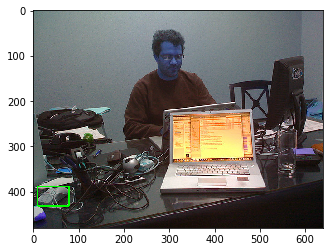

Category : person, Status : failure
┌────────────────────────────────────────────┬────────┬──────────┬─────────┬────────────┐
│ Question                                   │ Answer │ Pred_woH │ Pred_wH │ Pred_wH_Bi │
├────────────────────────────────────────────┼────────┼──────────┼─────────┼────────────┤
│ is it a person                             │      0 │        0 │       0 │          0 │
├────────────────────────────────────────────┼────────┼──────────┼─────────┼────────────┤
│ are they riding a horse                    │      1 │        1 │       0 │          0 │
├────────────────────────────────────────────┼────────┼──────────┼─────────┼────────────┤
│ are they facing away from the camera       │      1 │        0 │       1 │          1 │
├────────────────────────────────────────────┼────────┼──────────┼─────────┼────────────┤
│ are they standing up                       │      0 │        0 │       0 │          0 │
├────────────────────────────────────────────┼────────┼─────────

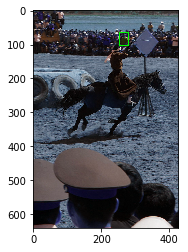

Category : car, Status : failure
┌─────────────────────────────────┬────────┬──────────┬─────────┬────────────┐
│ Question                        │ Answer │ Pred_woH │ Pred_wH │ Pred_wH_Bi │
├─────────────────────────────────┼────────┼──────────┼─────────┼────────────┤
│ is it orange                    │      1 │        1 │       1 │          1 │
├─────────────────────────────────┼────────┼──────────┼─────────┼────────────┤
│ is it a sign                    │      1 │        1 │       1 │          1 │
├─────────────────────────────────┼────────┼──────────┼─────────┼────────────┤
│ is it a person                  │      1 │        1 │       1 │          1 │
├─────────────────────────────────┼────────┼──────────┼─────────┼────────────┤
│ is it a vehicle                 │      0 │        0 │       0 │          0 │
├─────────────────────────────────┼────────┼──────────┼─────────┼────────────┤
│ is it white                     │      1 │        0 │       0 │          0 │
├──────────────────

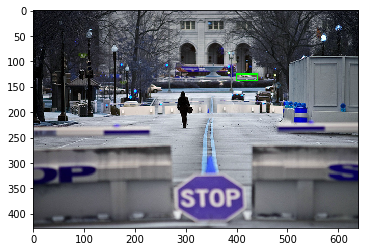

Category : backpack, Status : failure
┌──────────────────────────┬────────┬──────────┬─────────┬────────────┐
│ Question                 │ Answer │ Pred_woH │ Pred_wH │ Pred_wH_Bi │
├──────────────────────────┼────────┼──────────┼─────────┼────────────┤
│ is it a person           │      1 │        1 │       1 │          1 │
├──────────────────────────┼────────┼──────────┼─────────┼────────────┤
│ is it a piece of luggage │      0 │        0 │       0 │          0 │
├──────────────────────────┼────────┼──────────┼─────────┼────────────┤
│ is it black              │      1 │        0 │       1 │          1 │
└──────────────────────────┴────────┴──────────┴─────────┴────────────┘


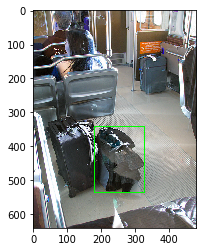

In [20]:
for i in list_failure[25:30]:
    img, questions, true_answers, pred_answers_WoH, pred_answers_WH, pred_answers_WH_Bilstm, category, game_status, object_loc = evaluate_function(i)
    x,y,w,h = object_loc
    print("Category : %s, Status : %s" % (category_list[str(category)], game_status))
    data = [["Question", "Answer", "Pred_woH", "Pred_wH", "Pred_wH_Bi"]]
    for i in range(len(questions)):
        data.append([questions[i], true_answers[i], pred_answers_WoH[i], pred_answers_WH[i], pred_answers_WH_Bilstm[i]])
    print(to_text(data))
    img = cv2.rectangle(img, (int(x),int(y)), (int(w),int(h)),(0,255,0), 2)
    plt.imshow(img)
    plt.show()

Category : person, Status : incomplete
┌───────────────────────┬────────┬──────────┬─────────┬────────────┐
│ Question              │ Answer │ Pred_woH │ Pred_wH │ Pred_wH_Bi │
├───────────────────────┼────────┼──────────┼─────────┼────────────┤
│ is it a human         │      0 │        0 │       0 │          0 │
├───────────────────────┼────────┼──────────┼─────────┼────────────┤
│ is he riding the bike │      1 │        0 │       0 │          0 │
└───────────────────────┴────────┴──────────┴─────────┴────────────┘


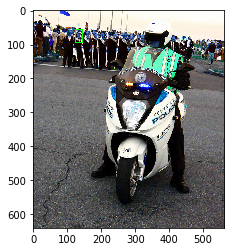

Category : person, Status : incomplete
┌────────────────┬────────┬──────────┬─────────┬────────────┐
│ Question       │ Answer │ Pred_woH │ Pred_wH │ Pred_wH_Bi │
├────────────────┼────────┼──────────┼─────────┼────────────┤
│ is it a person │      0 │        0 │       0 │          0 │
├────────────────┼────────┼──────────┼─────────┼────────────┤
│ is it a man    │      2 │        0 │       1 │          1 │
├────────────────┼────────┼──────────┼─────────┼────────────┤
│ is it a woman  │      2 │        1 │       2 │          2 │
└────────────────┴────────┴──────────┴─────────┴────────────┘


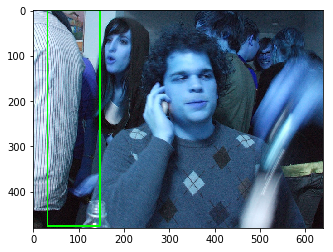

Category : car, Status : incomplete
┌────────────────────────────────────────┬────────┬──────────┬─────────┬────────────┐
│ Question                               │ Answer │ Pred_woH │ Pred_wH │ Pred_wH_Bi │
├────────────────────────────────────────┼────────┼──────────┼─────────┼────────────┤
│ is it a person                         │      1 │        1 │       1 │          1 │
├────────────────────────────────────────┼────────┼──────────┼─────────┼────────────┤
│ is it food                             │      1 │        1 │       1 │          1 │
├────────────────────────────────────────┼────────┼──────────┼─────────┼────────────┤
│ is it something on a person            │      1 │        1 │       1 │          1 │
├────────────────────────────────────────┼────────┼──────────┼─────────┼────────────┤
│ is it a building                       │      1 │        1 │       1 │          1 │
├────────────────────────────────────────┼────────┼──────────┼─────────┼────────────┤
│ is it something 

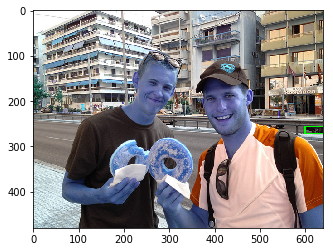

Category : oven, Status : incomplete
┌──────────────────────────────────────┬────────┬──────────┬─────────┬────────────┐
│ Question                             │ Answer │ Pred_woH │ Pred_wH │ Pred_wH_Bi │
├──────────────────────────────────────┼────────┼──────────┼─────────┼────────────┤
│ is it furniture                      │      1 │        1 │       1 │          1 │
├──────────────────────────────────────┼────────┼──────────┼─────────┼────────────┤
│ is it near the sink                  │      1 │        1 │       1 │          1 │
├──────────────────────────────────────┼────────┼──────────┼─────────┼────────────┤
│ is it the green bottle               │      1 │        1 │       1 │          1 │
├──────────────────────────────────────┼────────┼──────────┼─────────┼────────────┤
│ is it on the stove                   │      1 │        1 │       1 │          1 │
├──────────────────────────────────────┼────────┼──────────┼─────────┼────────────┤
│ is it below the cabinets             

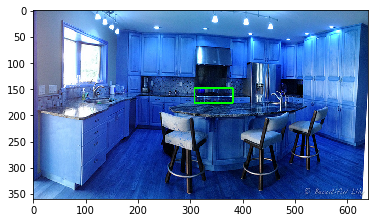

Category : suitcase, Status : incomplete
┌───────────────────────────────────────────┬────────┬──────────┬─────────┬────────────┐
│ Question                                  │ Answer │ Pred_woH │ Pred_wH │ Pred_wH_Bi │
├───────────────────────────────────────────┼────────┼──────────┼─────────┼────────────┤
│ is it a bag                               │      0 │        0 │       0 │          0 │
├───────────────────────────────────────────┼────────┼──────────┼─────────┼────────────┤
│ the whole bag                             │      1 │        0 │       0 │          0 │
├───────────────────────────────────────────┼────────┼──────────┼─────────┼────────────┤
│ is it in the front of the picture         │      1 │        1 │       1 │          1 │
├───────────────────────────────────────────┼────────┼──────────┼─────────┼────────────┤
│ is it the bag to the right of the picture │      1 │        0 │       1 │          1 │
├───────────────────────────────────────────┼────────┼──────────┼────

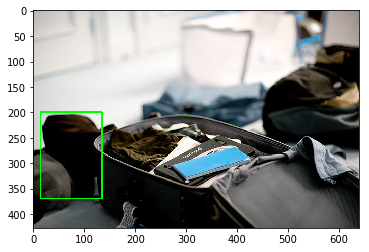

In [27]:
for i in list_incomplete[45:50]:
    img, questions, true_answers, pred_answers_WoH, pred_answers_WH, pred_answers_WH_Bilstm, category, game_status, object_loc = evaluate_function(i)
    x,y,w,h = object_loc
    print("Category : %s, Status : %s" % (category_list[str(category)], game_status))
    data = [["Question", "Answer", "Pred_woH", "Pred_wH", "Pred_wH_Bi"]]
    for i in range(len(questions)):
        data.append([questions[i], true_answers[i], pred_answers_WoH[i], pred_answers_WH[i], pred_answers_WH_Bilstm[i]])
    print(to_text(data))
    img = cv2.rectangle(img, (int(x),int(y)), (int(w),int(h)),(0,255,0), 2)
    plt.imshow(img)
    plt.show()